In [1]:
import numpy as np
import pandas as pd
import nltk
nltk.download('punkt')
from collections import Counter
from string import punctuation
import bokeh
import re

[nltk_data] Downloading package punkt to /home/daria/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
data = pd.read_csv('/home/daria/kamchatka.csv')
data = data.drop(['№'], axis=1)
data

,Сообщение
0,"Пейзаж Камчатки, узнаваемый и уникальный. Авач..."
1,@annakazakova121 и в пробке будем стоять не в ...
2,"Да, снег вывезли Горизонт Север!"
3,25 января 2022\nСегодня вывозим снег в районе ...
4,«Осиное гнездо» - так по НАТОвской классификац...
...,...
3784,В столице Камчатки проходит стихийный митинг и...
3785,"По данным «КАМЧАТКА-ИНФОРМ», сегодня политичес..."
3786,Александр Баннов.\n#Камчатка #Вилючинский #бух...
3787,"Этнодеревня, назвали же. Верх лицемерия."


In [3]:
text = data['Сообщение'].tolist()

In [4]:
text = ' '.join(data['Сообщение'].tolist())

# Preprocessing (tokenization, lemmatization, stopwords removal)

In [5]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/daria/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [6]:
tokenized = word_tokenize(text, language='russian')

In [7]:
from pymorphy2 import MorphAnalyzer
morph = MorphAnalyzer()

In [6]:
stops = stopwords.words('russian')

In [9]:
normalized = [morph.parse(token)[0].normal_form for token in tokenized]


In [10]:
# adding more symbols to the standard punctuation

punctuation = """
...—``''–»«!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~
"""

In [11]:
normalized_clean = [word for word in normalized if (word not in punctuation) and (word not in stops)]


In [12]:
len(normalized_clean)

214645

In [13]:
normalized_clean[:10]

['пейзаж',
 'камчатка',
 'узнавать',
 'уникальный',
 'авачинский',
 'бухта',
 'бра́т',
 'группа',
 'выступать',
 'вода']

# Training a Word2Vec model to extract word embeddings

In [14]:
from gensim.models import Word2Vec

In [15]:
model = Word2Vec([normalized_clean], 
                 vector_size=32,      
                 min_count=3,  
                 window=5
             
                )

In [16]:
model.train(normalized_clean, total_words=len(normalized_clean), epochs=100)

(21595200, 157355100)

In [17]:
model.wv.most_similar('камчатка')

[('располагаться', 0.6692783236503601),
 ('kamchatka_repost', 0.6214469075202942),
 ('очень', 0.5805948972702026),
 ('здешний', 0.5762699842453003),
 ('дфо', 0.5753999948501587),
 ('какой-либо', 0.5742227435112),
 ('масленица', 0.5699185729026794),
 ('37', 0.5535231232643127),
 ('роль', 0.5496171116828918),
 ('петропавловск-камчатский', 0.5484439730644226)]

In [18]:
model.wv.most_similar('петропавловск-камчатский')

[('😜', 0.6253895163536072),
 ('январь', 0.6192142367362976),
 ('сказать', 0.6086391806602478),
 ('пельмень', 0.6029273271560669),
 ('ч', 0.6011611223220825),
 ('❄', 0.5961881875991821),
 ('ᅠ', 0.5910474061965942),
 ('💙', 0.5899194478988647),
 ('⠀', 0.5876243114471436),
 ('🔹', 0.581591010093689)]

In [19]:
model.wv.most_similar('сахалин')

[('съёмочный', 0.618075430393219),
 ('становление', 0.5696916580200195),
 ('противолодочный', 0.548941969871521),
 ('kamchatka.aif.ru', 0.5381853580474854),
 ('испания', 0.5302857160568237),
 ('капуста', 0.5247134566307068),
 ('2-4', 0.5151811242103577),
 ('фонтан', 0.512580931186676),
 ('реальность', 0.510606050491333),
 ('визитный', 0.5084550976753235)]

The results don't seem to provide any insights into data so far, so next step is to visualize the vectors to see if there are any clusters

# Visualizing the word vectors

In [20]:
# extracting 10,000 most frequent words
top_k = sorted(model.wv.index_to_key, key=lambda w: model.wv.get_vecattr(w, 'count'))[::-1][:10000]

In [21]:
top_k[:10]

['бухта',
 'камчатка',
 'это',
 'год',
 'камчатский',
 'который',
 'авачинский',
 'город',
 'петропавловск-камчатский',
 'ул.']

In [22]:
top_k_wv = model.wv[top_k]

## Reducing the dimensionality with TSNE

In [25]:
from sklearn.manifold import TSNE 

In [26]:
tsne = TSNE()

In [27]:
embed = tsne.fit_transform(top_k_wv)

/home/daria/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/daria/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [28]:
import matplotlib.pyplot as plt

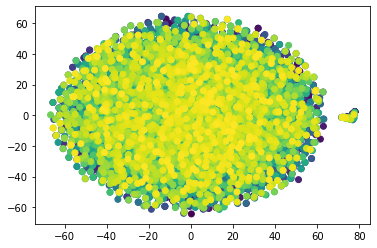

In [29]:
plt.scatter(embed[:, 0], embed[:, 1], c=range(len(top_k)))

## Using bokeh library to make an interactive plot

In [30]:
import bokeh.models as bm, bokeh.plotting as pl
from bokeh.io import output_notebook
output_notebook()

def draw_vectors(x, y, radius=10, alpha=0.25, color='blue',
                 width=600, height=400, show=True, **kwargs):
    """ draws an interactive plot for data points with auxilirary info on hover """
    if isinstance(color, str): color = [color] * len(x)
    data_source = bm.ColumnDataSource({ 'x' : x, 'y' : y, 'color': color, **kwargs })

    fig = pl.figure(active_scroll='wheel_zoom', width=width, height=height)
    fig.scatter('x', 'y', size=radius, color='color', alpha=alpha, source=data_source)

    fig.add_tools(bm.HoverTool(tooltips=[(key, "@" + key) for key in kwargs.keys()]))
    if show: pl.show(fig)
    return fig

Loading BokehJS ...

In [31]:
draw_vectors(embed[:, 0], embed[:, 1], token=top_k)

Figure(id='1004', ...)

The plot doesn't show any clusters. The low quality of embeddings might be the reason. Pre-trained transformer models are a better way to extract higher quality embeddings.

Another way to improve the value of the meaning extracted from the plot is to use sentences instead of words. Unlike words which only bear one descriptive feature, sentences are full pieces of ideas, so their vectors might be able to indicate something.

# Using a transformer to get sentence embeddings

In [32]:
import numpy as np
import torch
from transformers import AutoTokenizer, AutoModel

## Tokenizing by sentences

In [33]:
from nltk import sent_tokenize

In [34]:
sentences = sent_tokenize(text, 'russian')

In [35]:
sentences[:5]

['Пейзаж Камчатки, узнаваемый и уникальный.',
 'Авачинская бухта, Три Бра́та — группа из трех выступающих из воды столбообразных скал.',
 'Скалы являются официальным памятником природы и своеобразным символом Авачинской бухты и города Петропавловска-Камчатского.',
 'Холст на двп, масло.',
 'высота 20см/длина 34 см. Поверхность не зализана, текстурная, пастозные мазки.']

## Loading a pre-trained transformer

In [36]:
tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased-sentence")

model = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased-sentence")

## Extracting sentence embeddings

In [37]:
encoded_input = tokenizer(sentences, padding=True, truncation=True, max_length=64, return_tensors='pt')
with torch.no_grad():
    model_output = model(**encoded_input)
embeddings = model_output.pooler_output
embeddings = torch.nn.functional.normalize(embeddings)
print(embeddings)

tensor([[-0.0272, -0.0582,  0.0126,  ..., -0.0472,  0.0454,  0.0634],
        [ 0.0033, -0.0349,  0.0274,  ..., -0.0523,  0.0354,  0.0351],
        [ 0.0055, -0.0424, -0.0029,  ..., -0.0324,  0.0285,  0.0403],
        ...,
        [-0.0062, -0.0269,  0.0078,  ..., -0.0394,  0.0082, -0.0085],
        [-0.0016, -0.0492, -0.0050,  ..., -0.0301,  0.0320,  0.0373],
        [-0.0224, -0.0581,  0.0034,  ..., -0.0248,  0.0241,  0.0318]])


In [38]:
embed_tsne = tsne.fit_transform(embeddings)

/home/daria/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/daria/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [39]:
draw_vectors(embed_tsne[:, 0], embed_tsne[:, 1], token=sentences)

Figure(id='1114', ...)

The only clusters that showed up are emoji and numbers. Also there are some small clusters for what seems to be heading of the news articles.

In [7]:
data

,Сообщение
0,"Пейзаж Камчатки, узнаваемый и уникальный. Авач..."
1,@annakazakova121 и в пробке будем стоять не в ...
2,"Да, снег вывезли Горизонт Север!"
3,25 января 2022\nСегодня вывозим снег в районе ...
4,«Осиное гнездо» - так по НАТОвской классификац...
...,...
3784,В столице Камчатки проходит стихийный митинг и...
3785,"По данным «КАМЧАТКА-ИНФОРМ», сегодня политичес..."
3786,Александр Баннов.\n#Камчатка #Вилючинский #бух...
3787,"Этнодеревня, назвали же. Верх лицемерия."


In [8]:
text = data['Сообщение'].tolist()

In [9]:
len(text)

3789

In [10]:
filt_text = []

for i in text:
    filt_text.append(re.sub('\d+', '', i))

In [11]:
filt_text

['Пейзаж Камчатки, узнаваемый и уникальный. Авачинская бухта, Три Бра́та — группа из трех выступающих из воды столбообразных скал. Скалы являются официальным памятником природы и своеобразным символом Авачинской бухты и города Петропавловска-Камчатского. Холст на двп, масло. высота см/длина  см. Поверхность не зализана, текстурная, пастозные мазки. Не оформлена.\nАвачинская бухта.\nyoula.ru',
 '@annakazakova и в пробке будем стоять не в Ленинской районе а на солнечной и кп)',
 'Да, снег вывезли Горизонт Север!',
 ' января \nСегодня вывозим снег в районе АЗС-Силуэт, в мкр. Горизонт-Север и Горизонт-Юг, в том числе на ул. Академика Королева, , , , ул. Космонавтов, .\nПроизвели работы по расчистке и посыпке дворовой территории на ул. Космонавтов, , , расчистили проезд на ул. Ушакова.\nОсобое внимание дорожные службы уделяют пешеходным зонам и тротуарам.\n#новыйПетропавловск\n#городскаяистория\n#городменяется\n#теперьбудетлучше\n#город',
 '«Осиное гнездо» - так по НАТОвской классификации н

In [12]:
from sklearn.feature_extraction.text import CountVectorizer

In [57]:
cv = CountVectorizer(analyzer='word', ngram_range=(2,2), stop_words=stops)

In [58]:
vectors = cv.fit_transform(filt_text)

In [59]:
bigrams = cv.get_feature_names_out()

In [60]:
len(bigrams)

121250

In [61]:
bigrams[110000:110100]

array(['туристский быт', 'туристский информационный',
       'туристско информационный', 'туристско рекреационного',
       'туристского информационного', 'туристской тропе',
       'туристу попасть', 'туристы будут', 'туристы видами',
       'туристы восторге', 'туристы городе', 'туристы заходя',
       'туристы интересуются', 'туристы камчатки', 'туристы которые',
       'туристы обычно', 'туристы опыта', 'туристы останавливаются',
       'туристы представить', 'туристы приезжают', 'туристы часто',
       'туристы чаще', 'турисы нам', 'турков идешь', 'турнир проходил',
       'турнир честь', 'турнира ждут', 'турнира края',
       'турнира определятся', 'турнира ускоренный', 'турниру летчики',
       'турниры состязания', 'турниры спортивные', 'туров жители',
       'туров конце', 'туров обязательно', 'туров отдохнули',
       'туром посвятил', 'туроператорам туроператоры',
       'туроператоров возникла', 'туроператоров туроператоров',
       'туроператоры предлагают', 'туроператоры 

In [62]:
count_values = vectors.toarray().sum(axis=0)

In [63]:
vocab = cv.vocabulary_

In [64]:
vectors

<3789x121250 sparse matrix of type '<class 'numpy.int64'>'
	with 194333 stored elements in Compressed Sparse Row format>

In [65]:
df_bigrams = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram'})

In [66]:
df_bigrams[:30]

,frequency,bigram
0,343,петропавловске камчатском
1,287,петропавловска камчатского
2,285,авачинской бухты
3,271,петропавловск камчатский
4,241,ru news
5,236,камчатка информ
6,222,камчатского края
7,200,vk com
8,168,авачинская бухта
9,164,kamtoday ru


In [40]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import LatentDirichletAllocation

In [46]:
tfidf_vectorizer = TfidfVectorizer(stop_words=stops, ngram_range=(2,2))
lda = LatentDirichletAllocation(n_components=5)
pipe = make_pipeline(tfidf_vectorizer, lda)
pipe.fit(data['Сообщение'])


def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()
print_top_words(lda, tfidf_vectorizer.get_feature_names(), n_top_words=3)

Topic #0: содержит прикрепленные, смотрите полной, полной версии
Topic #1: петропавловск камчатский, авачинской бухты, петропавловска камчатского
Topic #2: это сероглазка, озерновская коса, авачинской бухты
Topic #3: история отмечай, отмечай club74105021, видео история
Topic #4: авачинская бухта, камчатское время, петропавловск камчатский



Код для подсчета частотности биграм и топик моделинга взят [отсюда](https://towardsdatascience.com/text-analysis-basics-in-python-443282942ec5)